# GEOG5990M Final Assignment (Template)

Student ID number: 201732575

**Social resource assessment: Is fuel resource distributed equally in Leeds?**



**Introduction:**
Fuel poverty has become a more and more severe problem for most European families. It is defined as, when a family can not afford the energy srvice to hold their decent life, then it is fuel poverty<a href="#ref1">[1]</a>. This project is designed to assess the social resource--fuel, in this case--to see is it distributed evenly in Leeds. The study idea derives from an environmental assessment concept: Environmental Justice Analysis. It is usually used to assess whether the air quality is equal between regions with different deprivation<a href="#ref1">[2]</a>. Distributive analyses are common required in the USA for all Federal policy and projects, and in the UK are now routine for projects like railways or highways <a href="#ref1">[3]</a>.  Here we use this concept to evaluate if fuel poverty is unevenly distributed. Ideally, social resources should be evenly distributed, so a group of similar people should have similar fuel poverty rates. This project will divide the households in Leeds into 10 groups with a similar number by decile, and then calculate the average fuel poverty rate for each group to see if they are similar. There will also be spatial visualizations presented to the public and policymakers to check whether there is a injustice in the allocation of fuel resources.

In [ ]:
from google.colab import files
files.upload() # to avoid unexpected errors when uploading data, using this code to upload data files "Leeds.geojson" and "Fuel poverty by LSOA.csv".

In [ ]:
!pip install geopandas matplotlib # install the Geopandas and Matplotlib, they can be used to draw the map.

In [ ]:
!pip install mapclassify # this package is needed while explore the shapefile

In [ ]:
pip install libpysal # this package is needed when doing spatial regression analysis

In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import libpysal
from collections import defaultdict
# import the required packages

In [ ]:
fuel_poverty=pd.read_csv('Fuel poverty by LSOA.csv')#read in fuel poverty data
#data sources: Data Mill North https://datamillnorth.org/dataset/2j70l/fuel-poverty-by-lsoa-england
fuel_poverty.head()# look at the first 5 rows in the data to check it's been read in successfully

The study area of this project is Leeds, but currently the data is for the whole UK, so now read in the Leeds geospatial data files and join the fuel poverty data to the Leeds file according to the 'LSOA Code' and 'LSOA21CD' column. The codes are as follows:

In [ ]:
leeds_shp =gpd.read_file('Leeds.geojson') # read in the Leeds file
# Data source: Data downloaded from https://geoportal.statistics.gov.uk/maps/761ecd09b4124843b95511a242e2b1a1
leeds_shp.head()# show the first 5 rows of the Leeds file

In [ ]:
leeds_fuel =leeds_shp.merge(fuel_poverty, how='left',left_on='LSOA21CD',right_on='LSOA Code')# join the two files together
leeds_fuel.head()# show the first 5 rows of the new file

In [ ]:
leeds_fuel.dtypes # check the data type of each the columns.

In [ ]:
# @title Data preprocessing and cleaning

Now we have read in the fuel poverty data and check the types of each column. Can find that the type of 'Number of households' is object, it should be int64 as the 'Number of households in fuel poverty'. For the convenience of the subsequent research, try to change the type, the codes are as follows:

In [ ]:
 # the .to_numeric should be able to change the data type, use codes below to try:
 #(this is an attempt, these codes didn't work, so I put them after "#")
#fuel_poverty['Number of households'] = fuel_poverty.to_numeric(fuel_poverty['Number of households'])
#fuel_poverty.dtypes

In [ ]:
 # the last attempt didn't work, it shows: AttributeError: 'DataFrame' object has no attribute 'to_numeric'. So let's try a new method:

 # use .astype(int) here to change the type, in case the "," in object would cause confusion, use .str.replace(',','') to remove it.
 # (this is the second attempt, sometimes it works and sometimes it doesn't, the last way in the lower cell is the safest, so I put this one after '#' too)
#fuel_poverty['Number of households']=fuel_poverty['Number of households'].str.replace(',','').astype(int)
#fuel_poverty.dtypes# check if it works

In [ ]:
# It would brek down sometimes, so here we can calculate a new column from the Number of households in fuel poverty and Proportion of households fuel poor (%)
#Here we divide the number of fuel poverty by its proportion to get the total households, and then round this number to the whole number
leeds_fuel['households number']=(leeds_fuel['Number of households in fuel poverty']/leeds_fuel['Proportion of households fuel poor (%)']*100).astype(int)
leeds_fuel.head()# show the first 5 rows to check if it works

In [ ]:
# It works! Now let's check whether there are any missing values in the table:
leeds_fuel.isna().sum()

In [ ]:
# the results above show no missing values.
leeds_fuel['households number'].describe()
# have a quick look of two variables by data description

In [ ]:
# describe the data to see how it distributes
leeds_fuel['Proportion of households fuel poor (%)'].describe()

As we can see in the description table, there are 488 counts in total, the average of housholds is 720, it ranges from 446 to 1423, the standard deviation is relatively big, which means the number of people living in each household varies greatly. The standard deviation of the proportion is not big compared to the other variable, but the highest proportion is 51.1%, while the minimum is only 3.2%, the difference is too big. Which might be a severe problem for the society because the fuel poverty is highly correlated with the sense of well-being of a society<a href="#ref1">[4]</a>. And can infer that there are some injustice.

To observe the data more intuitively, use histograms and scatter plots to see how the data is distributed.

The project topic is to study the relationship between fuel poverty and the households number, the number of households in fuel poverty is only an intermediate variable. So here decided to draw the histograms of households number and proportion respectively to see their respective distribution, and draw their common scatter plots to explore the general relationship. The codes are as follows:

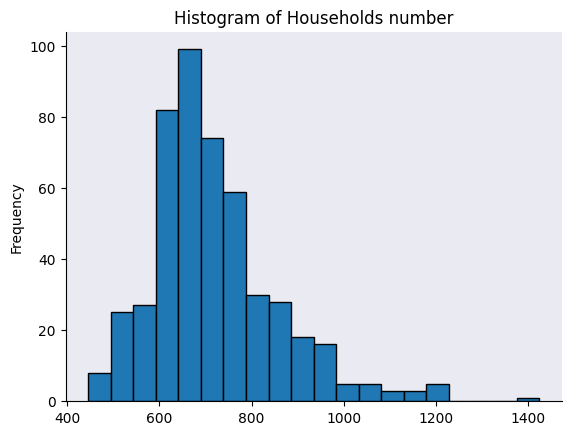

In [ ]:
# @title Households number
leeds_fuel['households number'].plot(kind='hist', bins=20, title='Histogram of Households number',edgecolor='black')
# this code is creating a histogram using the column "households number" and name after this, bins=20 means divide the data into 20 groups, and edgecolor gives each bar a black edge
plt.gca().spines[['top', 'right',]].set_visible(False)
# this code is making the right and top borders transparent, to look better.
plt.gca().set_facecolor('#eaeaf2') # this code is giving the chart a background color

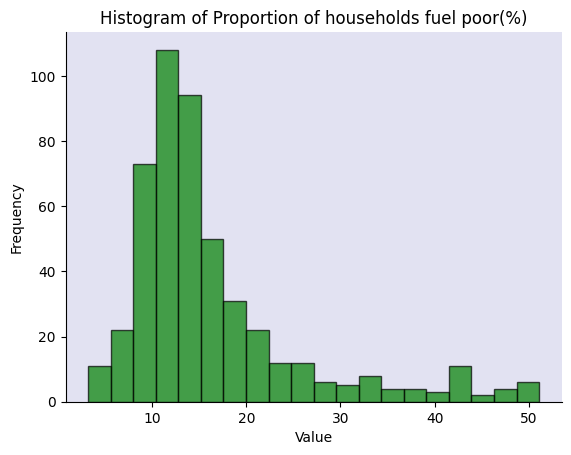

In [ ]:
# @title Proportion of households fuel poor(%)
plt.hist(leeds_fuel['Proportion of households fuel poor (%)'], bins=20, color='green',edgecolor='black',alpha=.7)
# This code is creating a histogram by the column 'Proportion of households fuel poor (%)',bins=20 means divide the data into 20 groups, 'color='green'' means set green as the bin's color
# 'edgecolor='black'' is setting black as each bar's edgecolor, 'alpha=.7' is setting the transparency as 0.7
plt.xlabel('Value') # Annotate the x-axis as 'Value'
plt.ylabel('Frequency') # Annotate the y-axis as 'Frequency'
plt.gca().spines[['top', 'right',]].set_visible(False)
# this code is making the right and top borders transparent, to look better.
plt.gca().set_facecolor('#e2e2f2') # this code is giving the chart a background color different than the above
plt.title('Histogram of Proportion of households fuel poor(%)') # Add a name to the chart
plt.show() # show the chart

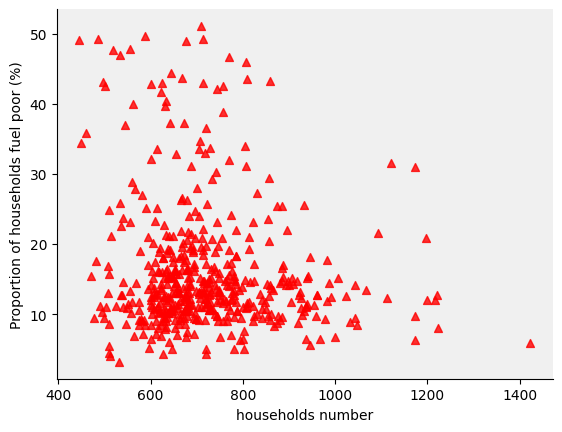

In [ ]:
# @title households number vs Proportion of households fuel poor(%)
leeds_fuel.plot(kind='scatter', x='households number', y='Proportion of households fuel poor (%)', s=32, alpha=.8,marker='^',c='red')
# This code is creating a scatter plot using 'households number' and 'Proportion of households fuel poor', making the first as X and the last as Y
# 's=32' is setting the size of the scatter; 'alpha=.8' sets the transparency of the scatter as 0.8; 'marker='^'' sets the scatter as triangle and 'c='red'' sets red as the color of the scatter
plt.gca().set_facecolor('#f0f0f0')# this code is giving the chart a background color
plt.gca().spines[['top', 'right',]].set_visible(False)# this code is making the right and top borders transparent, to look better.

From the histogram and the scatter plot we can vividly see that, the highest frequency of the proportion gathers around 10%. Ambrose and Marchand have done a research shows that, of those who died in the winter of 2014, nearly 1 of 5 died from cold<a href="#ref1">[5]</a>, seems not impossible from the charts. We can also find that, the high prportion and the majority of the proportion gathered around the few parts of households number, this may indicate that there is an irrational allocation of fuel.

To have a more rigorously relationship between the number of households and the fuel poverty proportion, build a regression model between the two variables. first, check the correlation between them, here we use the pearson correlation:

In [ ]:
correlation=np.corrcoef(leeds_fuel['households number'],leeds_fuel['Proportion of households fuel poor (%)'])[0, 1]
print("Pearson correlation coefficient:", correlation)# these two codes are showing the pearson correlation coefficient between the two variables.

In [ ]:
correlation=np.corrcoef(leeds_fuel['households number'],leeds_fuel['Number of households in fuel poverty'])[0, 1]
print("Pearson correlation coefficient:", correlation)# these two codes are showing the pearson correlation coefficient between the other two variables.

The pearson correlation coefficient between households and proportion is -0.14, close to 0, which means the number of housholds have a negative effect on the proportion of households fuel poverty, but the effect is small. Tested the correlation between households and the number of households in fuel poverty, can find that the number is small too, but there is a positive effect, which means with the increasing of the households, the number of households that suffering fuel poverty also increases, the decline in the proportion is only due to the faster growth rate of the total number of households.

In order to get a quantitative relationship between the household number and proportion, establish a regression model for them.

In [ ]:
df=pd.DataFrame(leeds_fuel)# making the 'leeds_fuel' file more easy to analyze as DataFrame
df['intercept']=1 # Add a constant column as an intercept in the regression
# Define the independent and dependent variables
X = df[['intercept', 'households number']]
y = df['Number of households in fuel poverty']
# Fit the OLS model
model = sm.OLS(y, X)
results = model.fit()
# Print the regression result
print(results.summary())

In [ ]:
af=pd.DataFrame(leeds_fuel)# making the 'leeds_fuel' file more easy to analyze as DataFrame
af['intercept']=1 # Add a constant column as an intercept in the regression
# Define the independent and dependent variables
X = af[['intercept', 'households number']]
y = af['Proportion of households fuel poor (%)']
# Fit the OLS model
model = sm.OLS(y, X)
results = model.fit()
# Print the regression result
print(results.summary())

Having 'Number of households in fuel poverty' and 'Proportion of households fuel poor (%)' as dependent variables separately for two regressions, it can be seen from Adj. R-squared that the fit of the two regression models is not high, which means that the increase in the number of households does not have much impact on fuel poverty from a non-spatial perspective.

To test whether there is any inequitable in fuel allocation, next will separate the households in Leeds into 10 groups with similar populations, and then calculate the average fuel poverty rate for each group. The codes are as follows:

In [ ]:
# calculate the total households in Leeds
total_population=leeds_fuel['households number'].sum()
# Calculate the average number of households in each region (similarly)
average_population_per_area = total_population / 10
# Sort regions by population from largest to smallest
sorted_households = leeds_fuel.sort_values(by='households number', ascending=False)
# 将地区分配到10个组中
groups=defaultdict(list)
current_population=0
current_group=0

for i, row in sorted_households.iterrows():
    area = row['LSOA21CD']
    population = row['households number']
    fuel_poverty_rate = row['Proportion of households fuel poor (%)']
    if current_population + population <= average_population_per_area:
        groups[current_group].append((area, population,fuel_poverty_rate))
        current_population += population
    else:
        current_group += 1
        groups[current_group].append((area,population,fuel_poverty_rate))
        current_population = population

# Create a DataFrame to store grouped data
group_data = []

# Print the regions for each group and their population numbers
# Here use the for loop to create a table, making the outcomes more readable
for group, areas in groups.items():
  group_population = sum(area[1] for area in areas)
  group_fuel_poverty_rate = sum(area[1] * area[2] for area in areas) / group_population
  group_data.append({'Group': group + 1,'Total Population': group_population,'Average Fuel Poverty Rate': group_fuel_poverty_rate})

group_df = pd.DataFrame(group_data)
#print the tale
print(group_df)

intended to have 10 groups, but get 11 eventually, it won't influence the result too much if we take the group 11 as an outliner and drop it.

In [ ]:
group_cleaned=group_df.drop(index=10)# drop the last row
print(group_cleaned)

In order to better observe the distribution of fuel poverty, describe the data:

In [ ]:
group_cleaned['Average Fuel Poverty Rate'].describe()

In [ ]:
# @title Spatial visualisation

**Spatial analysis:**
Next, analyze the variables spatially to see if there's any spatial inequitable distribution.

In [ ]:
# look at the distribution of the 'Proportion of households fuel poor (%)' variable.
leeds_fuel.explore(column='Proportion of households fuel poor (%)', cmap='viridis', legend=True)
# the main purpose of this step is to check whether it can show spatially or not

In [ ]:
# @title Results: Data Visualisation and Discussion

From the description of Average Fuel Poverty Rate we can infer that there might be a lightly injustice in fuel energy allocation, but to make it more convincing to the public and present the research findings to the policymakers, we will visualize the data next. It includes non-spatial visualisation, a bar chart of average fuel poverty, and spatial visualisation, creating choropleth maps for the key variables.

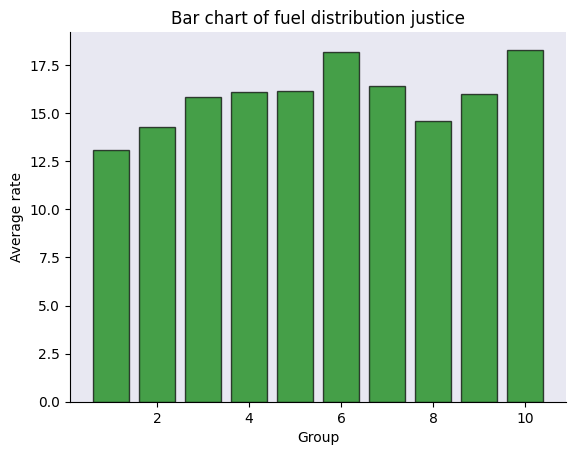

In [ ]:
# @title Non-spatial:Bar chart of fuel allocate justice
plt.bar(group_cleaned['Group'],group_cleaned['Average Fuel Poverty Rate'], color='green',edgecolor='black',alpha=.7)
# This code is creating a histogram by the column 'Average Fuel Poverty Rate',bins=20 means divide the data into 20 groups, 'color='green'' means set green as the bin's color
# 'edgecolor='black'' is setting black as each bar's edgecolor, 'alpha=.7' is setting the transparency as 0.7
plt.xlabel('Group') # Annotate the x-axis as 'Group'
plt.ylabel('Average rate') # Annotate the y-axis as 'Average rate'
plt.gca().spines[['top', 'right',]].set_visible(False)
# this code is making the right and top borders transparent, to look better.
plt.gca().set_facecolor('#e8e8f2') # this code is giving the chart a background color different than the above
plt.title('Bar chart of fuel distribution justice') # Add a name to the chart
plt.show() # show the chart

The data was made up with the number of households, the number of households in fuel proverty and the proportion of households fuel poor. To study if there's an unequal distribution, the decision I made was to calculate the total number of households and then separate them into 10 groups with similar number of households. The ideal situation should be that, the average proportion varies a little among the groups, this can show that society distributes fuel resources in such a way as to ensure that everyone has enough fuel to meet their basic needs for well-being.

As we can see from the bar chart and the description result, the average fuel poverty rate for each group is similar to each other, ranging from 13.1% to 18.29%, for the findings of the study, where nearly a quarter of households face fuel poverty<a href="#ref1">[6]</a>, such results and differences are broadly acceptable. But there are 2 groups(6 and 10) showing obivious outliners, which means there may be unfairness.

In [ ]:
# @title Spatial: Comparison between choropleth maps

In order to visually see the distribution of the households number and the distribution of the fuel poverty rate on the map, draw a choropleth map for each of these variables, because choropleth maps are the simplest way to show the differences between the performance metrics to be analyzed<a href="#ref1">[7]</a>. Compare the maps can find that, there is indeed an irrational allocation of fuel resources: regions with more households share lower fuel poverty rate, indicates that they have sufficient fuel resources, while regions with fewer households share a higher rate of fuel poverty, indicates the fuel energy is not enough.

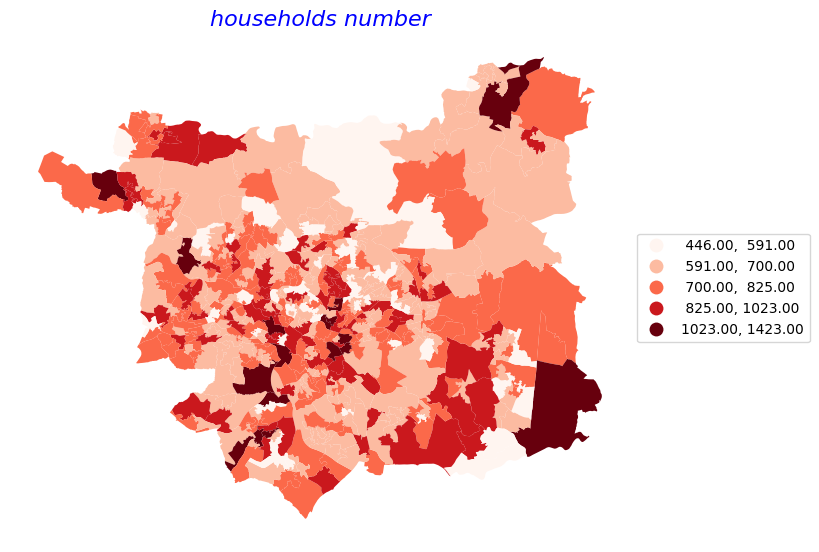

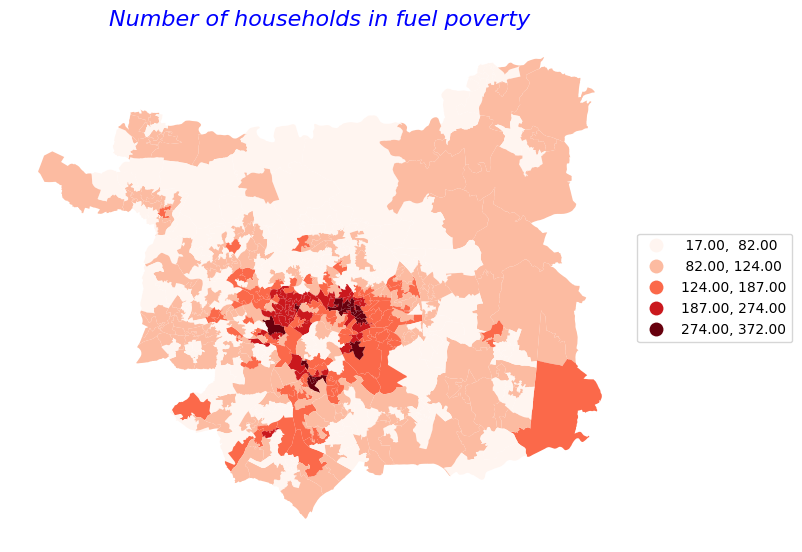

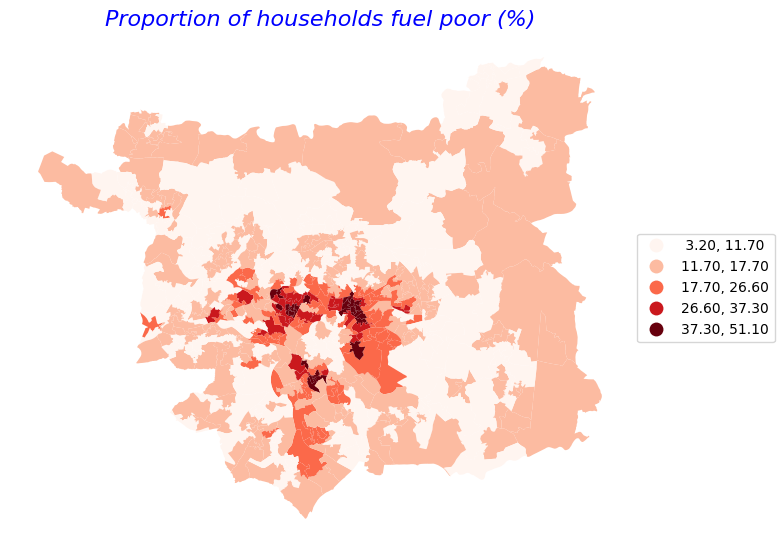

In [ ]:
# create a list of the columns we want to plot
want_cols =['households number','Number of households in fuel poverty','Proportion of households fuel poor (%)']
# create a for loop for plotting a map of each variable
# this saves writing out 3 blocks of code for each visualisation
# for each item in a range from 0 to 3 (number of items in the want_cols list)
for i in range (0,len(want_cols)):
    # produce a plot
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    # get the ith item in the want column list and plot
    leeds_fuel.plot(column=want_cols[i],

    #### format the plot ###

    # reduce linewidth between polygons
    linewidth=0.1,
    # set the data as categorical (ordinal)
    categorical=True,
    # show the legend
    legend=True,
    # set the grading method to fisher_jenks, this minimizes differences within each level
    scheme='fisher_jenks',
    # color the legend
    cmap='Reds',
    #set the axis
    ax=ax,
    # place the legend on a best suit place
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.5)})
    # add a title based on the column plotted, formatting the title to look better
    plt.title(want_cols[i],color='blue',fontsize=16, fontstyle='italic')
    # do not plot with the axis showing
    plt.axis('off')
    # save the figure as an image with name reflecting the variable plotted
    plt.savefig(str(want_cols[i])+'.jpg',bbox_inches='tight')

As we can see from the figures that, the high number of households mostly distribute in the east-southern part of Leeds and the western part of the city centre. But the households in fuel poverty and the proportion of households suffering poor fuel are more gathered around the city centre. Which means spatially, places with fewer households are more likely to suffer from fuel poverty. If social energy is allocated evenly, it should be based on the population density, but now apparently it's not, which indicates that, from the perspective of distribution, the fuelallocation is indeed unequal.

In conclusion, there are obvious inequality in the fuel energy distribution in Leeds, there is a clear problem of fuel poverty in the city cente, while outlying urban areas have more households and more fuel resources. This may be due to a number of reasons such as economic capacity, infrastructure, economic benefits, etc., but in any case, it deserves the attention of the public and policymakers and efforts to reduce this injustice as much as possible.

## References
<p><a href="#ref1">[1]</a>
  Middlemiss, L. (orcid:---) 2017. A critical analysis of the new politics of fuel poverty in England.
</p>
<p><a href="#ref2">[2]</a>Mitchell, G. and Dorling, D. 2003. An Environmental Justice Analysis of British Air Quality. Environment and planning. A. 35(5), pp.909–929.
</p>
<p><a href="#ref3">[3]</a>Department for Transport (2017) Consultation draft Airports national policy Statement: Interim equality assessment. Project no: 62103867 WSP, Parsons Brinckerhoff https://www.gov.uk/government/uploads/system/uploads/attachment_data/file/588973/interim-equality-assessment-consultation-draft-airports-nps.pdf
</p>
<p><a href="#ref3">[4]</a>Davillas, A., Burlinson, A. (orcid:---) and Liu, H.-H. 2022. Getting warmer: fuel poverty, objective and subjective health and well-being.
</p>
<p><a href="#ref4">[5]</a>
  Ambrose, A. and Marchand, R. (orcid:---) 2017. The contemporary landscape of fuel poverty research.
</p>
<p><a href="#ref5">[6]</a>
  Middlemiss, L. (orcid:---), Ambrose, A. (orcid:---), Simcock, N. (orcid:---X., Martiskainen, M. (orcid:---) and Sheriff, G. (orcid:---) n.d. Fuel poverty in the cost of living crisis. University of Leeds.
</p>
<p><a href="#ref5">[7]</a>
  Słomska-Przech, K. and Gołębiowska, I.M. 2021. Do Different Map Types Support Map Reading Equally? Comparing Choropleth, Graduated Symbols, and Isoline Maps for Map Use Tasks. ISPRS international journal of geo-information. 10(2), pp.69-.
</p>